# 🤔 What can we use singular values for?

Author:

*   Andrea Gentilini

Resources used for created this notebook are listed at the end. **Let's get started!**


💡 In this notebook, we are going to explore some applications of Singular Value Decomposition and low-rank approximation. We will start with a brief theoretical introduction, and then dive into practical applications.


# SVD - Singular Value Decomposition

Suppose we have an **arbitrary** matrix $A \in \mathbb{R}^{m \times n}$. Then, this matrix can be factorized as:

$ $
$$A = U \Sigma V^T$$

where:
- $U \in \mathbb{R}^{m \times m}$ is an orthogonal matrix
- $\Sigma \in \mathbb{R}^{m \times n} $ is a diagonal matrix with non-negative real numbers on the diagonal (known as **singular values**)
- $V^T \in \mathbb{R}^{n \times n}$ is an orthogonal matrix


In particular, $\Sigma $ is a rectangular diagonal matrix, for example:

$$
\Sigma = \begin{bmatrix}
\sigma_1 & 0 & 0\\
0 & \sigma_2 & 0 \\
0 & 0 & \sigma_3 \\
0 & 0 & 0 \\
0 & 0 & 0 \\
\end{bmatrix}
$$

**OBSERVATION:** If $rank(A)=k$, then: $\sigma_1 \geq \sigma_2 \geq \sigma_3 \geq ... \geq \sigma_k > \sigma_{k+1} = ... = \sigma_n$. In fact, the number of non-zero singular values determines the rank of the matrix $A$.

--------------

**PROP:** If $A$ is orthogonal, their singular values have to be 1

**PROOF:** $A$ is orthogonal, this means that $ A^TA = A A^T = I $. Recall that the singular values of a matrix $ A $ are the square roots of the eigenvalues of $ A^T A $. Since $ A $ is orthogonal, we have that the eigenvalues of $ I $ are all 1, as it is the identity matrix.



## ✍🏻 Graphic interpretation of SVD

The fact that **any** matrix can be factorized as the product of $U \Sigma V^T$, as defined above, means that any linear transformation can be represented as a combination of three distinct linear transformations:

1. **A Rotation** - Represented by $ V^T $, which is an orthogonal matrices and thus perform a rotation without altering the scale
2. **A Rescaling** - Represented by $ \Sigma $, where the diagonal elements (singular values) scale the axes of the vector
3. **Another Rotation** - After the scaling, another orthogonal transformation $U$ is applied

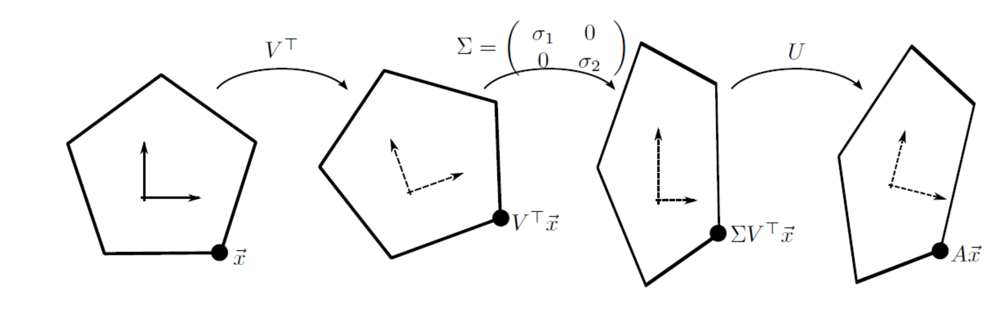

## ⬇️ Reduced SVD and Silent rows/column

The **Reduced SVD** provides a more compact representation of the standard SVD, and is particularly useful when $ A $ has a rank $k$ which is less than $ \min(m, n) $.

In fact, the standard Singular Value Decomposition has some silent rows and columns, in the sense that there are some rows/columns that do not contribute in the reconstruction of A.

The last $(m-k)$ rows and columns of $\Sigma$ are useless, since are full of zeros. From this, it follows that some columns/rows of $U$ and $V^T$ are also useless. Infact, these rows and columns do not contribute to the matrix product $ A $ because multiplying them by zero negates any effect they might have had.

This is what reduced SVD looks like:

$$ A = \tilde{U} \tilde{\Sigma} \tilde{V^T}$$


where:
- $\tilde{U} \in \mathbb{R}^{m \times k} $ contains the first $k$ columns of $U$, that are the first $k$ left singular vectors of $A$
- $\tilde{\Sigma} \in \mathbb{R}^{k \times k}$ is a diagonal matrix containing the top (non-zero) $k$ singular values
- $\tilde{V^T} \in \mathbb{R}^{k \times n}$ contains the first $k$ rows of $V^T$, meaning that is the transpose of a matrix that contains the first $k$ singular vectors of $A$

$ $


**Why using the reduced SVD?**:
- **Efficiency**: Reduced SVD is computationally more efficient and uses less storage, as it ignores silent rows/columns. A real case example is shown later in this notebook.
- **Accuracy**: Maintaining only significant singular values (ignoring near-zero or zero values) may improve the numerical stability and accuracy of computations involving $A$.

# Low rank approximation

Once we have the Singular Value Decomposition (SVD) of a matrix $A$, we can express it in terms of the outer products of its singular vectors:

$$A = U \Sigma V^T = \sum_{i=1}^{n} \sigma_i u_i v_i^T$$

Noting that:

$$ u_i v_i^T = \begin{bmatrix} u_{i1} \\ u_{i2} \\ \vdots \\ u_{im} \end{bmatrix} \begin{bmatrix} v_{i1} & v_{i2} & \ldots & v_{in} \end{bmatrix}
= \begin{bmatrix}
u_{i1}v_{i1} & u_{i1}v_{i2} & \ldots & u_{i1}v_{in} \\
u_{i2}v_{i1} & u_{i2}v_{i2} & \ldots & u_{i2}v_{in} \\
\vdots & \vdots & \ddots & \vdots \\
u_{im}v_{i1} & u_{im}v_{i2} & \ldots & u_{im}v_{in}
\end{bmatrix} $$

$ $

From this expression is clear that the matrix resulting from an outer product $\in \mathbb{R}^{m \times n}$ and has $ rank = 1$. In fact, all the columns are are scalar multiples of vector $u_i$, and all the rows are are scalar multiples of the vector $v_i^T$.

In other words, thanks to SVD, we can express **any** matrix A as the summation of matrices each having $rank=1$, weighted with the singular values $\sigma_i$.

$ $

---------------
**OBSERVATION:** we can use $n = min(n, m)$ as maximum term of summation when expressing the matrix $A$ as a sum of outer products. This is because the remaining columns in $ \Sigma $ beyond $ \min(m, n) $ are zeroed out, effectively contributing nothing to the sum.

--------------
$ $

**What if we want to approximate $A$ with fewer terms?**

We can truncate the sum to $p$ terms, for an arbitrary $p$.
$$\tilde{A} = \sum_{i=1}^{p} \sigma_i u_i v_i^T$$

In other words, we are setting all but the first $p$ largest singular values to zero, resulting in representing A as the sum of the $p$ most significant (in terms of singular values) matrices.

In this way:
- **we save lot of memory**
- we find the **matrix of rank at most $p$ that best approximate** the matrix $A$. This means that no other matrix of rank $p$ approximate $A$ better than $\tilde{A}$ (see the next chapter for a better understanding)
- we have a manner of **controlling the rank** of the matrix approximating $A$





## 🚨 Error related to using low rank approximation

We construct the matrix:
$$ \tilde{A} := \sum_{i=1}^{p} \sigma_i u_i v_i^T$$

by truncating all but the first $p$ largest singular values to zero.

-----------
**Theorem: Eckart-Young**

The matrix $ \tilde{A} $ minimizes the error $ \|A - \tilde{A}\|_2 $ subject to the constraint that the column space of $ \tilde{A} $ has at most dimension $ p $.

$ $

**Proof**

Let $A \in \mathbb{R}^{m \times n}$ be a real rectangular matrix with $m \geq n$. Suppose that:$ A = U\Sigma V^T $ is the singular value decomposition of $A$.

We claim that the best rank-$p$ approximation to $A$ is given by:

$$
\tilde{A} := \sum_{i=1}^p \sigma_i u_i v_i^T
$$

where $u_i$ and $v_i$ denote the $i$-th column of $U$ and $V$, respectively.

First, note that we have:

$$
\|E_p\|_2 = \|A - \tilde{A}\|_2 = \left\| \sum_{i=1}^n \sigma_i u_i v_i^T - \sum_{i=1}^p \sigma_i u_i v_i^T \right\|_2 = \left\| \sum_{i=p+1}^n \sigma_i u_i v_i^T \right\|_2
$$

Where $E_p$ is the error that we commit by approximating A with $\tilde{A}$. From this expression, it is clear that the SVD of $E_p$ is so that $\Sigma = diag(\sigma_{p+1}, ... \sigma{n}) $.

Then, from the definition of $\|.\|_2$ trough the SVD, we have that $\|E_p\|_2 = \sigma_{p+1}$.

$ $

Therefore, we need to show that this error $E_p$ is the minimum possible among all rank-$k$ approximations of $A$. In other words, we need to show that if $B_p = XY^T$, where $X$ and $Y$ have $p$ columns (so that max. rank is $p$), then:

$$
\|A - \tilde{A}\|_2 \leq \sigma_{p+1} \leq \|A - B_p\|_2 .
$$

Since $Y$ has $p$ columns, then there must be a nontrivial linear combination of the first $p + 1$ columns of $V$, i.e.,

$$
w = \gamma_1 v_1 + \ldots + \gamma_{p+1} v_{p+1},
$$

such that $Y^T w = 0$.

Without loss of generality, we can scale $w$ so that $\|w\|_2 = 1$ (or equivalently):

$$
\gamma_1^2 + \ldots + \gamma_{p+1}^2 = 1.
$$

Therefore,

$$
\|A - B_p\|_2 \geq \|(A - B_p)w\|_2 = \|Aw\|_2 = \gamma_1^2 \sigma_1^2 + \ldots + \gamma_{p+1}^2 \sigma_{p+1}^2 \geq \sigma_{p+1}.
$$

The result follows by taking the square root of both sides of the above inequality.


----------

$ $

As evident in the proof above, the error $ \|A - \tilde{A}\|_2 $ made by approximating $ A $ with $ \tilde{A} $ depends on the singular values that are truncated. The approximation error is equal to $ \sigma_{p+1} $, where $ p $ is the number of singular values retained in the sum. The error reduces as more terms are included, but it can only be minimized up to the smallest non-zero singular value excluded from the approximation. Thus, while **the error can be controlled by the choice of $ p $**, it cannot be made arbitrarily small unless the neglected singular values are inherently small or zero.


# Applications

## 🌅 Image compression

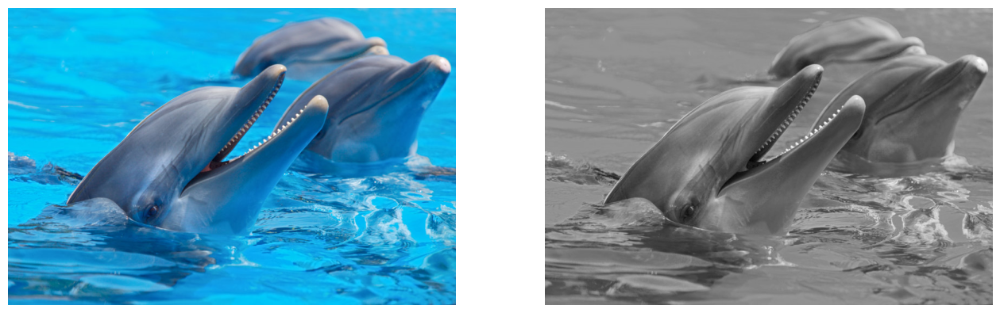

In [1]:
# plotting the raw image
from matplotlib.image import imread
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams['figure.figsize'] = [16,8]

A = imread('delfini.jpg') # (pixels_x, pixels_y, 3)
X = np.mean(A, -1) # convert RGB to grayscale doing the mean on the third dimension, for SVD

# Creating a figure with 2 subplots
fig, ax = plt.subplots(1, 2)

# Plotting the original image
ax[0].imshow(A)
ax[0].axis('off')  # Hiding the axes for the original image

# Plotting the grayscale image
ax[1].imshow(X, cmap='gray')
ax[1].axis('off')  # Hiding the axes for the grayscale image

# Displaying the figure
plt.show()

In [2]:
# X is a 2D matrix, then we can calculate its SVD
# doc: https://numpy.org/doc/stable/reference/generated/numpy.linalg.svd.html

U, S, VT = np.linalg.svd(X, full_matrices=False) # reduced SVD, in this case only VT changes
S_values = np.diag(S) # taking singular values from S

# let's check that dimensions matches
print(X.shape)
print(U.shape)
print(S.shape) # even if full_matrices = True still numpy does not display the rows full of zeros
print(VT.shape)

(549, 825)
(549, 549)
(549,)
(549, 825)


In [3]:
def calculate_memory_used(X, format='bytes'):
  bytes_per_element = 8 #float64 format
  m, n = X.shape
  memory_X = m * n * bytes_per_element # in bytes
  if format=='mb':
    memory_X_in_mb = memory_X / (1024 * 1024)
    return memory_X_in_mb
  return memory_X

def calculate_memory_used_approx(X, n, m, p, format='bytes'):
  # U.shape = (m, p), VT.shape = (p*n), S is saved as a vector of shape p
  bytes_per_element = 8 # float64 format
  return (m * p + p + p * n) * bytes_per_element

-----------------------------------------------------------------------
Memory used for the initial matrix: 3623400 bytes
Memory used for the approximated matrix: 22000 bytes
Memory used for p = 2: 0.61%


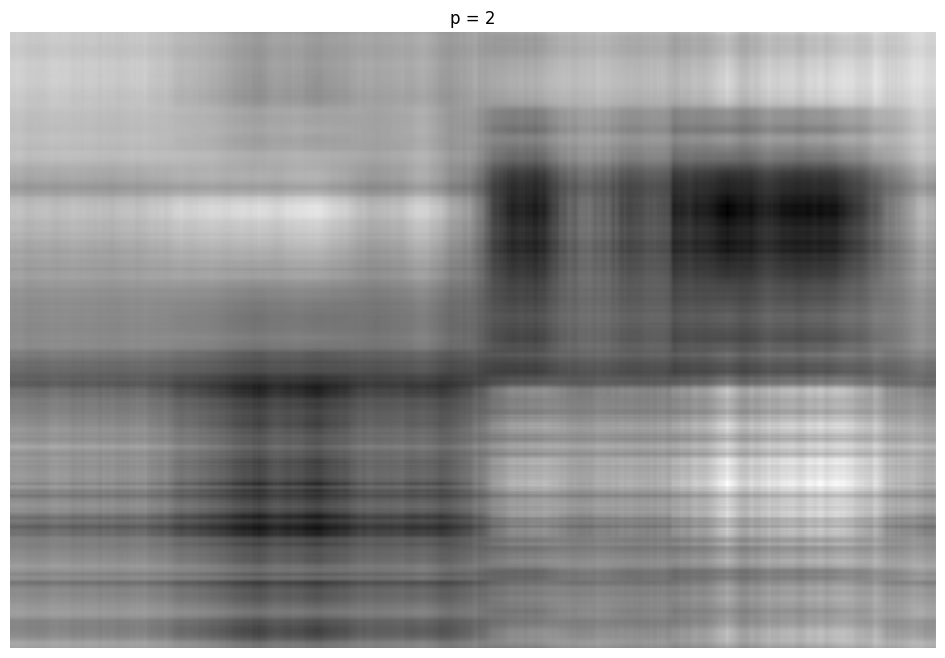

-----------------------------------------------------------------------
Memory used for the initial matrix: 3623400 bytes
Memory used for the approximated matrix: 55000 bytes
Memory used for p = 5: 1.52%


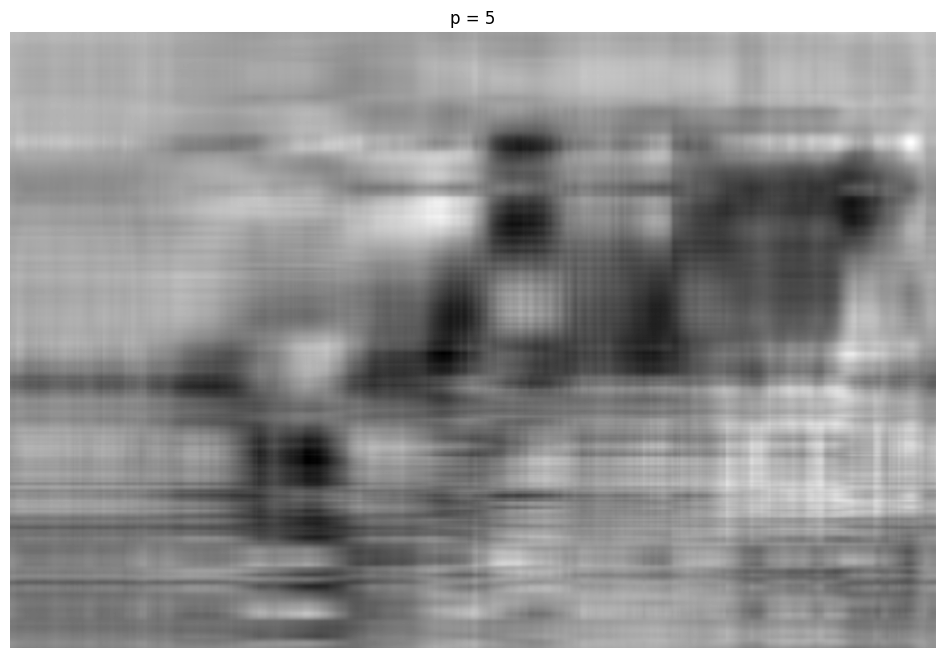

-----------------------------------------------------------------------
Memory used for the initial matrix: 3623400 bytes
Memory used for the approximated matrix: 110000 bytes
Memory used for p = 10: 3.04%


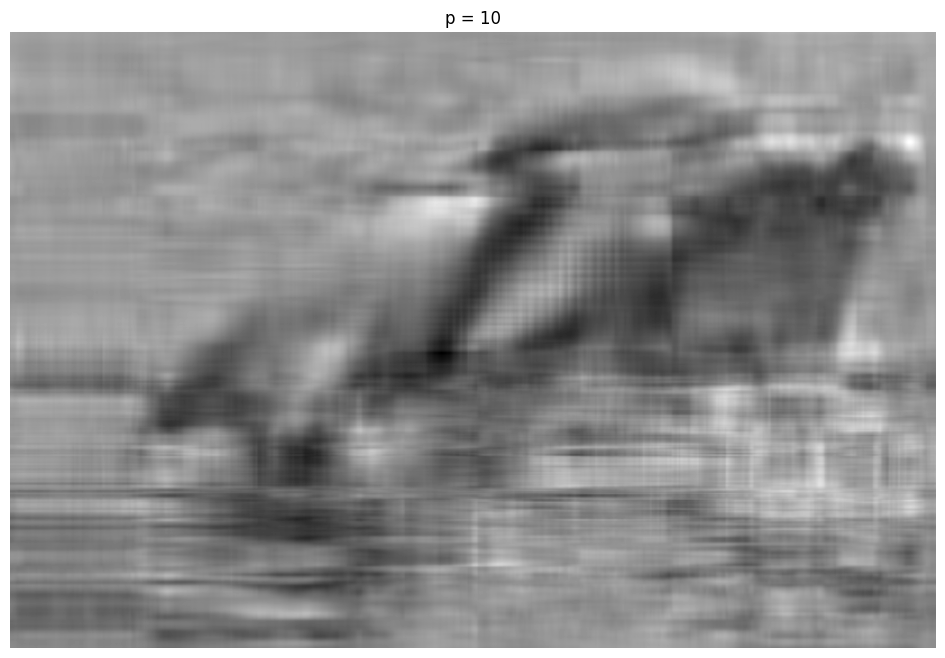

-----------------------------------------------------------------------
Memory used for the initial matrix: 3623400 bytes
Memory used for the approximated matrix: 220000 bytes
Memory used for p = 20: 6.07%


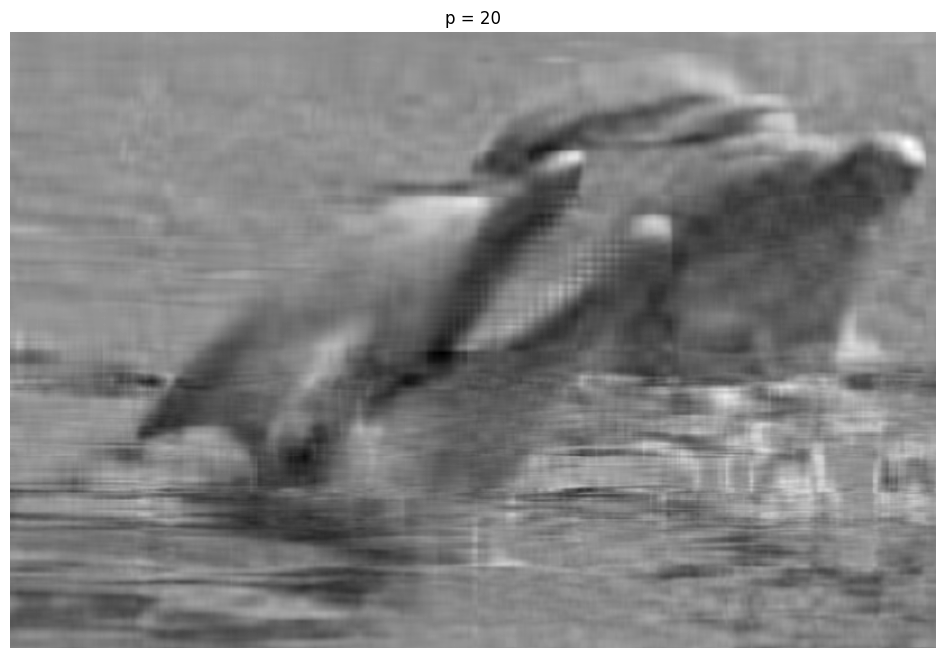

-----------------------------------------------------------------------
Memory used for the initial matrix: 3623400 bytes
Memory used for the approximated matrix: 1100000 bytes
Memory used for p = 100: 30.36%


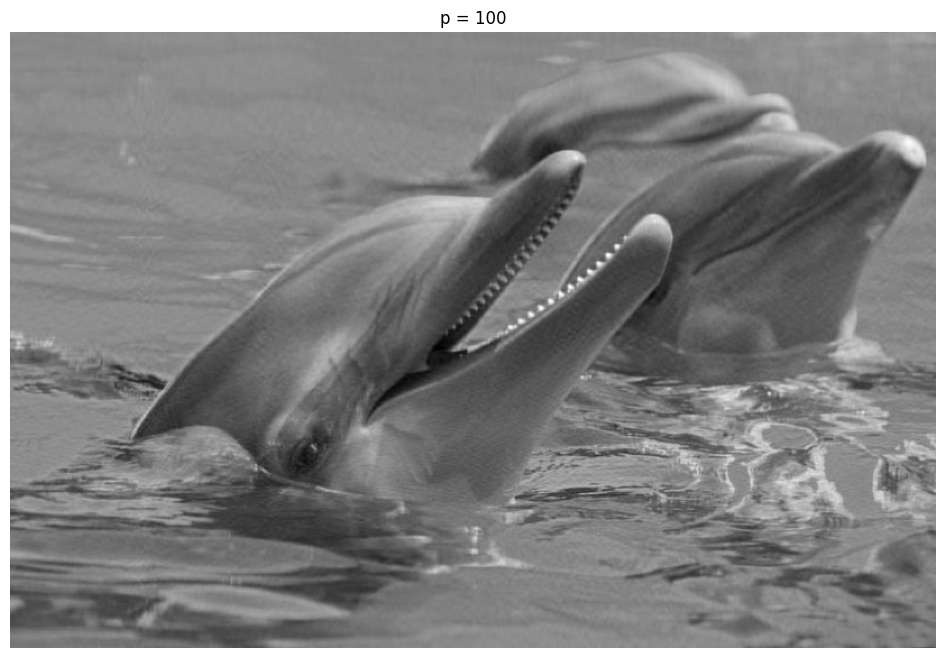

-----------------------------------------------------------------------
Memory used for the initial matrix: 3623400 bytes
Memory used for the approximated matrix: 3300000 bytes
Memory used for p = 300: 91.07%


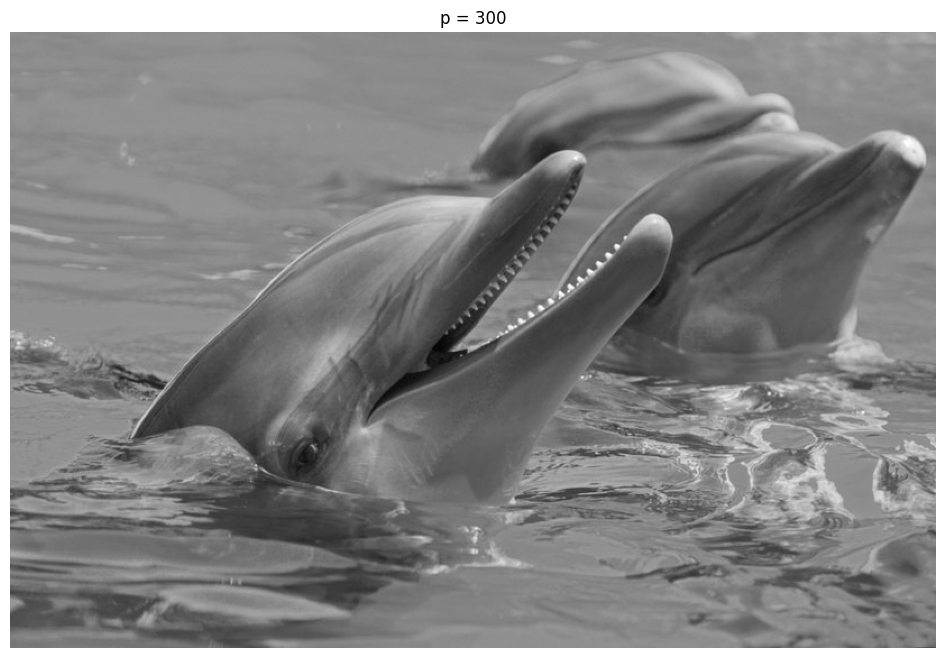

In [4]:
# let's visualize compressed images and how much memory they use

# memory used for X
memory_X = calculate_memory_used(X, format = 'bytes') # in bytes

j = 0
for p in (2, 5, 10, 20, 100, 300):

  print('-----------------------------------------------------------------------')

  # construct approximate image
  Xapprox = U[:, :p] @ S_values[0:p, :p] @ VT[:p, :]

  # memory used for X_approx
  memory_approx =  calculate_memory_used_approx(Xapprox, X.shape[0], X.shape[1], p, format = 'bytes') # in bytes
  print(f'Memory used for the initial matrix: {memory_X} bytes')
  print(f'Memory used for the approximated matrix: {memory_approx} bytes')

  # memory saved
  memory_used_in_percentage = (memory_approx / memory_X) * 100
  print(f'Memory used for p = {p}: {memory_used_in_percentage:.2f}%')

  plt.figure(j+1)
  j+=1
  plt.imshow(Xapprox, cmap='gray')
  plt.axis('off')
  plt.title(f'p = {p}')
  plt.show()

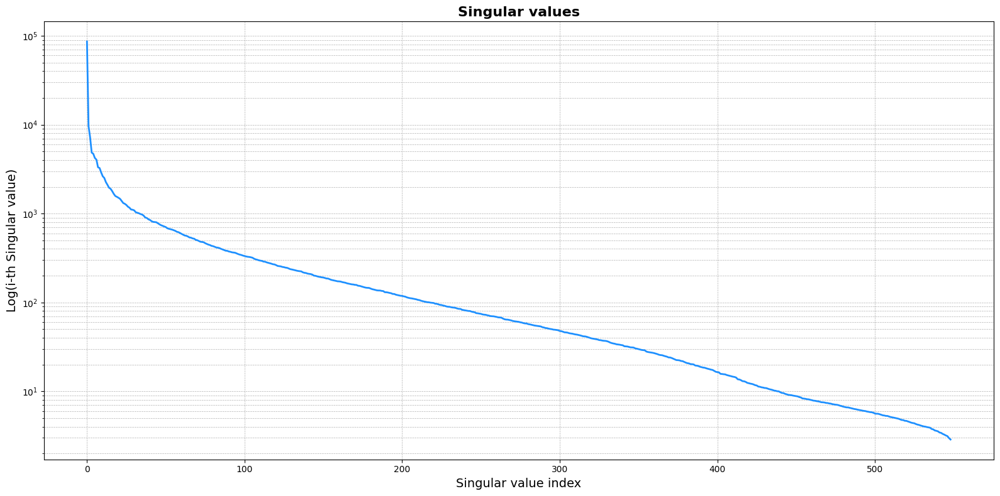

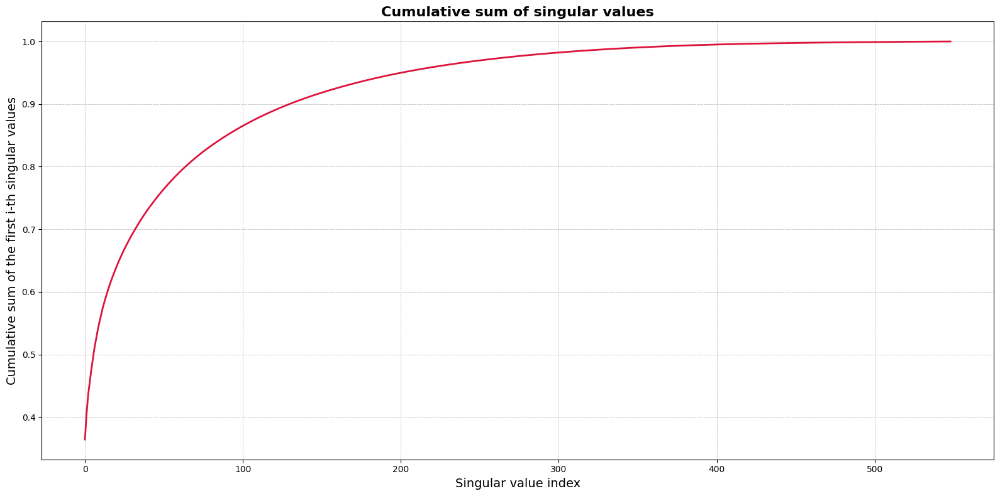

In [5]:
# let's plot the singular values and the cumulative sum of the singular values

# singular values in semi-log scale
plt.figure(1)
plt.semilogy(S, linestyle='-', color='dodgerblue', linewidth=2, markersize=8)
plt.title('Singular values', fontsize=16, fontweight='bold')
plt.xlabel('Singular value index', fontsize=14)
plt.ylabel('Log(i-th Singular value)', fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

print('')
print('')
print('')

# cumulative sum of singular values
plt.figure(2)
plt.plot(np.cumsum(S)/np.sum(S), linestyle='-', color='crimson', linewidth=2)
plt.title('Cumulative sum of singular values', fontsize=16, fontweight='bold')
plt.xlabel('Singular value index', fontsize=14)
plt.ylabel('Cumulative sum of the first i-th singular values', fontsize=14)
plt.grid(True, which='major', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

"""
sum from 1 to p of the singular values / sum from 1 to n of the singular values (as function of p)
How much of the matrix is captured by the first p singular values
"""
pass

**Pattern-based images**

We notice that when we use a pattern-based image (e.g., chess_board.png), it still looks remarkably good even with a very low-rank (e.g., rank 5) approximation. This effectiveness is because a **matrix with repetitive blocks or features tends to have fewer distinct singular values** (as we can infer from the semilogy plot above), which implies that the matrix can be well approximated using fewer components. The significant singular values represent the most impactful features of the image. The larger values correspond to the repetitive nature of grids, meaning much of the image information is captured by the leading singular vectors. Less significant singular values, which often correspond to noise or less critical details, can be discarded without substantial loss of image quality.

This is extremely evident from the cumulative sum shown above. **Almost all the energy (i.e., information) of the initial matrix is captured by the very first p singular values**.

## 💨 Denoising

Another interesting application is to use low-rank approximation as a method for **denoising images**. This approach is based on the assumption that a noisy image can be represented as a matrix that is the sum of a low-rank matrix (corresponding to the original, clean image) and a sparse matrix (corresponding to the noise). The goal is to recover the low-rank matrix, which should be a close approximation of the clean image.

Let’s examine a set of **images that are identical** in framing and size but include **some noise elements**. For instance, consider several frames from a fixed camera video recording a ski slope. All the images will be identical except for the movement of people skiing down the slope.

Another interesting application involves stamps that are all the same except for differences in scratches, stamps, and folds.

**The key objective is to capture attributes that are most characteristic of the majority of images.**

With this concept in mind, by organizing our data into a matrix (for example, by saving the images as vectors), we can use the **low-rank approximation** of the Singular Value Decomposition (SVD) to **filter out sporadic features that are not useful for representing the overall images population**.

In [6]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# load data
def load_data():
    print("loading data ...")
    N = 24 # number of images
    images = [0]*N
    for i in range(N):
        if i < 9:
            name = f"/Users/andreagentilini/Desktop/SVD_applications/Data_ski/resized_000{i+1}.jpg"
        else:
            name = f"/Users/andreagentilini/Desktop/SVD_applications/Data_ski/resized_00{i+1}.jpg"
        images[i] = np.array(Image.open(name))

    images = np.array(images).astype(np.float64)/255. # pixel's value between 0 and 1
    print("load complete!")
    return images

images = load_data()
print(images.shape) # (24, 461, 851, 3)
N, H, W, p = images.shape

loading data ...
load complete!
(24, 454, 855, 3)


The dataset dimension is a matrix of shape (24, 461, 851, 3):

- 24 represents the number of images (N)
- 461 is the height of an image (H)
- 851 is the width of an image (W)
- 3 refers to the number of RGB channels (p)

(24, 454, 855, 3)


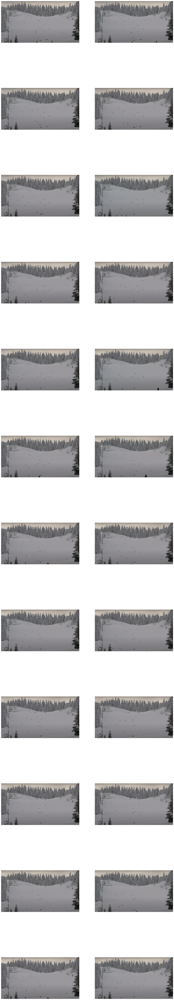

In [7]:
# Visualize data in a grid

def plot_data(data):
    rows = 12
    cols = len(data)//rows
    fig, axes = plt.subplots(rows, cols, figsize=(10*cols,10*rows))
    for i,ax in enumerate(axes.flat):
        ax.imshow(data[i])
        ax.axis('off')
    plt.show()

print(images.shape)
plot_data(images)

We notice that the ski tracks have people in different positions over time, but **the track and the background remain constant in all the images**.

Next steps:

1. **Reshape the dataset matrix** into the form N x (H * W * p). This means each image will become a row, resulting in N rows (corresponding to the number of images). Each row will contain the features of that image (we concatenate all pixels). **We need a 2D matrix for comuting SVD**.

2.	Calculate the mean of the images and subtract it from all of them. This step is crucial because it removes the mean bias from the data, allowing the SVD to capture the principal variations around the mean rather than around zero. This **helps to better isolate variations caused by signals of interest (e.g., main shapes in an image) rather than those due to constant variations in brightness or color**.

 After centering the matrix, the analysis through SVD aims to identify the directions (or principal components) along which the data varies the most. These components are represented by the left singular vectors ($U$ matrix) and right singular vectors ($V^T$ matrix) of the SVD. The singular values $\sigma$ indicate the importance of each of these directions. In the context of denoising, directions with larger singular values often correspond to the main structures of the image, while those with smaller singular values may be associated with noise.

3.	**Compute the SVD** (Singular Value Decomposition) on the resulting matrix.

In [8]:
# Reshape images -> transposing means that each image is a column
S = images.reshape(N, H*W*p).T # shape (H*W*p, N)

# Sm is a column vector of length (H*W*p) where the i-th position contains the average of all i-th pixels from each image.
Sm = np.mean(S, axis=1, keepdims=True) # let's maintain it 2D so that we can then do the subtraction

# Let's center the matrix
A = S - Sm

# SVD
U, s, Vt = np.linalg.svd(A, full_matrices=False) # set to False to not run out of memory

print((U.shape, s.shape, Vt.shape)) # singular values are stored in a vector 1D

((1164510, 24), (24,), (24, 24))


In [9]:
# reconstruction rank
r = 1

# let's reconstruct the image using LoRA
A_r = np.zeros(A.shape)
for k in range(A.shape[1]):
  A_r[:,k] = np.sum([U[:,i]*s[i]*Vt[i,k] for i in range(r)], axis=0)

# A_r has the same shape of A but is constructed using only the first r singular values

# Let's add back the mean (to reconstruct the color)
A_r += Sm

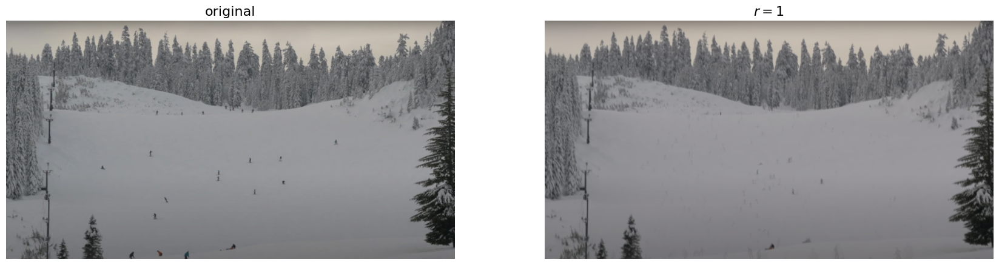

In [10]:
# index of the image to visualize
index = 5

# bring back the image to a matrix of shape (H, W)
H,W,p = images[index].shape
imr = A_r[:,index].reshape(H,W,p)

# Let's bring pixels in a valid range since LoRA doe not know that pixel can only have values between 0 and 1
imr[imr<0] = 0
imr[imr>1] = 1

# plot the two images
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(21,12))
ax1.imshow(images[index])
ax1.set_title("original", size=16)
ax1.axis("off")

ax2.imshow(imr)
ax2.set_title("$r={:d}$".format(r), size=16)
ax2.axis("off")
plt.show()

We can observe that the majority of people are mostly gone, while the one that remains is because they were mostly still in the various images.

**Another possible use case:**

Consider the scenario where you are taking a photo of a monument and want to remove the people passing in front. You could use the approach described above: take a burst shot (or generally multiple photos with a fixed framing). You will have photos with constant framing and background, where only the people passing by vary.

## 🎥 Tracking moving objects in a video

Let’s see now how we can use SVD (Singular Value Decomposition) to identify moving objects in a video and remove the background. In this case, **we are interested in removing the part that is most similar among all the elements that make up our data**. In the case of a fixed camera video, this will be the background.

In [11]:
import moviepy.editor as mpe # for video processing

import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image

**Let's create some utils functions.**

**Function "create_data_matrix_from_video"**:
Converts a video into a data matrix. Does some preprocessing (rescaling, converting to gray scale) before.

----------------------

**Function "rgb2gray":**

Is useful for image processing tasks where color information is not necessary, such as in certain types of feature detection, image segmentation, or pre-processing steps in machine learning pipelines. **This function uses specific weights for converting color images to grayscale in order to maintain the perception of color in terms of brightness.** The conversion takes into account the human eye’s varying sensitivity to different colors, which is not uniform: we are most sensitive to green, followed by red, and least sensitive to blue. The weights applied (0.299 for red, 0.587 for green, and 0.114 for blue) reflect this differential sensitivity.

When a color image is converted to grayscale in this manner, the result preserves a realistic representation of the original brightness perceived when the image was in color. This is particularly useful in many computer vision and image processing applications, where ensuring that important features of the image are maintained even after conversion is crucial.

In [12]:
# Let’s load a synthetic video; other similar videos can be found here http://backgroundmodelschallenge.eu
file_path = "/Users/andreagentilini/Desktop/SVD_applications/111.mp4"

video = mpe.VideoFileClip(file_path)

video.subclip(0,1).ipython_display(width=300)
video.duration

def create_data_matrix_from_video(clip, k=5, scale=50):
    """Converts a video clip into a data matrix for analysis.

    Args:
        clip (VideoFileClip): The video clip to process.
        k (int): The number of frames per second to sample from the video. Default is 5.
        scale (int): The factor by which to scale down the resolution of each frame. Default is 50.

    Returns:
        numpy.ndarray: A matrix where each column represents a flattened frame of the video.
        tuple: The dimensions of the frames after scaling (width, height).
    """
    frames = []  # Initialize an empty list to store processed frames.

    # Iterate over frames, sampling at 'k' frames per second of video duration.
    for i in range(k * int(clip.duration)):
        # Convert the current frame to grayscale and then to integer type.
        frame = rgb2gray(clip.get_frame(i / float(k))).astype(int)

        # Convert the grayscale frame to a PIL image and resize it.
        im = Image.fromarray(np.uint8(frame))  # Create an image object from the numpy array.
        im = im.resize((frame.shape[0] // scale, frame.shape[1] // scale), Image.LANCZOS)  # Scale down the image resolution.

        # Convert the image back to a NumPy array
        # flatten it (converted from a matrix to a vector), and append it to the frames list.
        frames.append(np.array(im).flatten())

    # Stack all the frame vectors vertically and transpose to create the data matrix.
    return np.vstack(frames).T, (frame.shape[1] // scale, frame.shape[0] // scale)  # Return the data matrix and the new frame dimensions.
    # The result is a matrix of shape (len(frame), number of frames), where len(frame) is the concatenation of all pixels in the frame.

def rgb2gray(rgb):
    """
    Convert an RGB image to a grayscale image using the luminosity method.

    Args:
        rgb (numpy.ndarray): A 3D numpy array representing an RGB image.
                             The dimensions are expected to be [height, width, channels].

    Returns:
        numpy.ndarray: A 2D numpy array representing the grayscale image.

    Description:
        This function converts an RGB image to grayscale by applying a dot product
        between each pixel's RGB value and a set of weights that correspond to the
        contribution of each color channel to the perceived luminosity. The weights are:
        - 0.299 for the Red channel,
        - 0.587 for the Green channel,
        - 0.114 for the Blue channel.
        These values are based on the human eye's sensitivity to these colors.
    """
    # Apply the dot product between the RGB values and the luminosity weights.
    return np.dot(rgb[..., :3], [0.299, 0.587, 0.114])

pass

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [13]:
# visualization

from IPython.display import HTML
from base64 import b64encode
import os

# video name
save_path = file_path

# compress the video for visualization
compressed_path = "result_compressed.mp4"
if os.path.exists(f"{compressed_path}"):
  os.remove(f"{compressed_path}")

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show the video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

ffmpeg version 7.0.1 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --

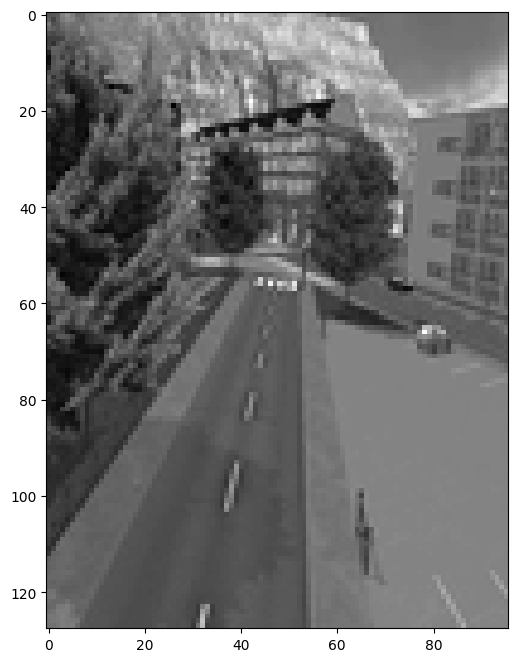

In [14]:
scale = 5   # Adjust the scale of the image to work on smaller data

M,dims = create_data_matrix_from_video(video, 15, scale)

# M is a matrix (12288, 885). 885 are the number of frames, while 12288 is the vector representation of each frame. Each column is a frame.

plt.imshow(np.reshape(M[:,1], dims), cmap='gray');

Now that we have the matrix $M$ containing all the frames, let’s compute the Singular Value Decomposition (SVD).

In [15]:
# compute SVD of M
u, s, v = np.linalg.svd(M, full_matrices=True)

# Let's check that dimensions matches
print(M.shape)
print(u.shape)
print(s.shape) # As usual, all zeros are omitted here, and s is represented only as a vector.
print(v.shape)

(12288, 885)
(12288, 12288)
(885,)
(885, 885)


**Let’s compute the background**. The background is the most constant part across all frames, i.e., it is captured by the first singular values.

In [16]:
# Obtain a low-rank approximation
sigma = np.zeros((u.shape[1], v.shape[0]))
sigma[range(0, v.shape[1]), range(0, v.shape[1])] = s # Place singular values on the diagonal of the sigma matrix

# Approximate by setting all uninteresting singular values to 0
rank_to_approx = 1
sigma[sigma < s[rank_to_approx - 1]] = 0

# Calculate the background
background = u @ sigma @ v

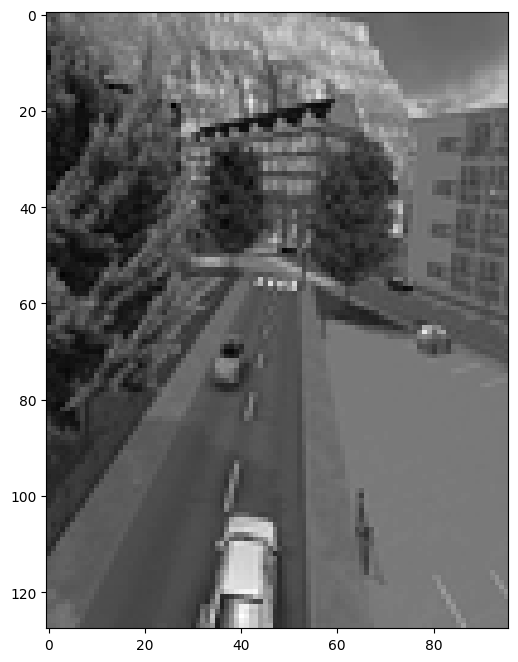

In [17]:
# Show a frame as example
frame_num = 550
plt.imshow(np.reshape(M[:,frame_num], dims), cmap='gray')

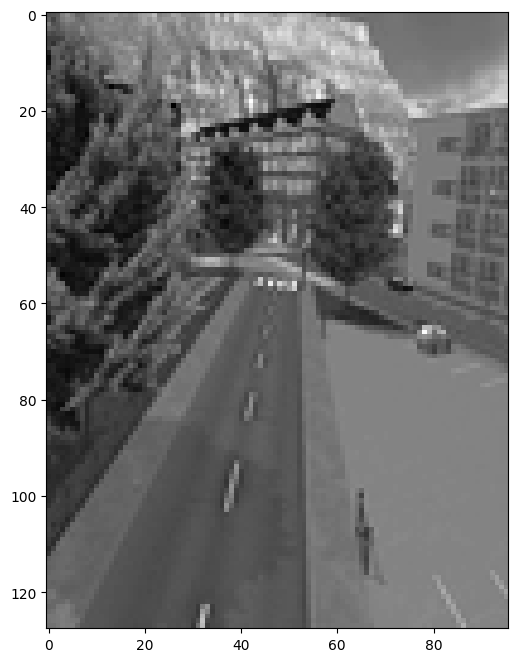

In [18]:
# Let’s see what the reconstruction of frame 550 looks like in low_rank
plt.imshow(np.reshape(background[:,frame_num], dims), cmap='gray');

Indeed, the cars are not visible, except for the two that are constantly parked. (That is, the background).

Let’s now remove the background by subtracting the background matrix from the entire matrix.

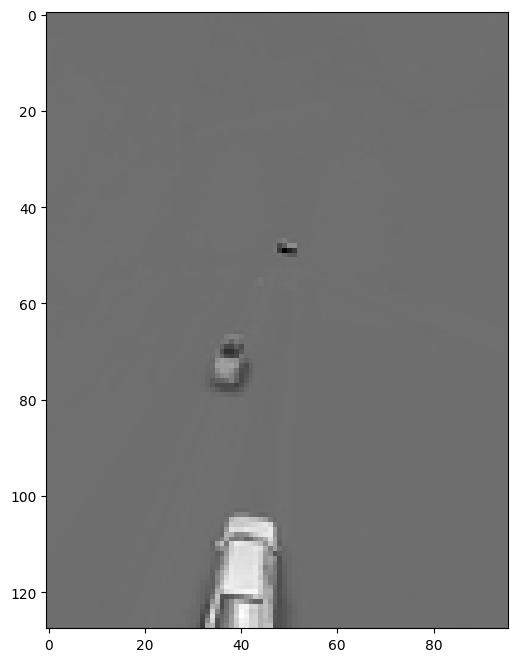

In [19]:
# Let’s remove the background by subtracting the background from the entire matrix.
plt.imshow(np.reshape(M[:,frame_num] - background[:,frame_num], dims), cmap='gray');

In [20]:
# RUN THIS CELL ONLY IF YOU ARE USING GOOGLE COLAB
"""
!pip install sk-video
"""
pass

In [21]:
# We can now generate the new video showing only the moving objects

import skvideo.io # handling video input and output operations

# Creating a list of frames where each frame isolates moving objects
frames = [np.reshape(M[:,k] - background[:,k], dims) for k in np.arange(0,M.shape[1])] # reshape to go back to initial dims
outputdata = np.array(frames)
outputdata+=np.min(outputdata) # adjusts the pixel values to ensure they are non-negative
outputdata = outputdata.astype(np.uint8) # more memory efficient and required for video encoding

save_path = "outputvideo2.mp4"
if os.path.exists(f"{save_path}"): # Checks if a file with the same name already exists at the save path
  os.remove(f"{save_path}")

skvideo.io.vwrite("outputvideo2.mp4", outputdata) # final video

# Let's visualize the reconstruction
from IPython.display import HTML
from base64 import b64encode

# Input video path
save_path = "outputvideo2.mp4"

# Compressed video path using ffmpeg
compressed_path = "output_compressed2.mp4"
if os.path.exists(f"{compressed_path}"):
  os.remove(f"{compressed_path}")

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
# Prepare HTML for video display in a Jupyter notebook environment
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)



ffmpeg version 7.0.1 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --

# 📚 Resources/Inspirations

* **Professor E. Rodolà** - Slides on PCA, spectra, and low-rank approximations. Available here: [E. Rodolà's material - ML24 course](https://github.com/erodola/ML-s2-2024)
* **Harvard Applied Math 205 Course Material**:
  * [Harvard's Course on Applied Mathematics](https://people.math.wisc.edu/~chr/am205/)
  * [SVD Image Processing Examples](https://github.com/chr1shr/am205_g_activities/tree/master/svd_image_processing)
* **YT 4K Urban Life** - Source used for fixed-camera image data: [YouTube Video](https://www.youtube.com/watch?v=GNV9a4Ilsq8&ab_channel=4KUrbanLife)
* **Background Models Challenge** - Resource for video datasets: [Background Models Challenge](http://backgroundmodelschallenge.eu)
* **Notebook for Background Removal** - Jupyter Notebook by fastai on background removal: [Notebook](https://nbviewer.org/github/fastai/numerical-linear-algebra/blob/master/nbs/3.%20Background%20Removal%20with%20Robust%20PCA.ipynb)
* **Professor E. Rodolà** - Notebook on SVD and LoRA. Available here: [E. Rodolà's material - NumMeth23 course](https://github.com/erodola/NumMeth-s2-2023)
* **Wikipedia**:
  * [Singular Value Decomposition](https://en.wikipedia.org/wiki/Singular_value)
  * [Low-rank Approximation](https://en.wikipedia.org/wiki/Low-rank_approximation)
* **📘 Book Reference** - A. Quarteroni, R. Sacco, F. Saleri, P. Gervasio, *Matematica Numerica*. Springer Milano, 2014.
* **Documentation** - Various docs of the different libraries used in this notebook.